# Lab14: MDP & Q-Learning & SARSA
<hr>

110062802 呂宸漢


## Environment Setup

In [1]:
import os
from ple.games.flappybird import FlappyBird
from ple import PLE

os.environ["SDL_VIDEODRIVER"] = "dummy"  # this line disable pop-out window

game = FlappyBird()
env = PLE(game, fps=30, display_screen=False)  # environment interface to game
env.reset_game()


pygame 2.1.2 (SDL 2.0.18, Python 3.9.13)
Hello from the pygame community. https://www.pygame.org/contribute.html
couldn't import doomish
Couldn't import doom


In [2]:
# return a dictionary whose key is action description and value is action index
print(game.actions)
# return a list of action index (include None)
print(env.getActionSet())


{'up': 119}
[119, None]


In [3]:
# a dictionary describe state
'''
    player y position.
    players velocity.
    next pipe distance to player
    next pipe top y position
    next pipe bottom y position
    next next pipe distance to player
    next next pipe top y position
    next next pipe bottom y position
'''
game.getGameState()


{'player_y': 256,
 'player_vel': 0,
 'next_pipe_dist_to_player': 309.0,
 'next_pipe_top_y': 144,
 'next_pipe_bottom_y': 244,
 'next_next_pipe_dist_to_player': 453.0,
 'next_next_pipe_top_y': 160,
 'next_next_pipe_bottom_y': 260}

In [4]:
num_action = len(env.getActionSet())
bucket_range_per_feature = {
    'next_next_pipe_bottom_y': 40,
    'next_next_pipe_dist_to_player': 512,
    'next_next_pipe_top_y': 40,
    'next_pipe_bottom_y': 20,
    'next_pipe_dist_to_player': 20,
    'next_pipe_top_y': 20,
    'player_vel': 4,
    'player_y': 16
}

MIN_EXPLORING_RATE = 0.01
MIN_LEARNING_RATE = 0.5

NUM_EPISODE = 40000
PRINT_EVERY_EPISODE = 500
SHOW_GIF_EVERY_EPISODE = 5000


## Utility Function

In [5]:
import numpy as np
import moviepy.editor as mpy


def make_anim(images, fps=60, true_image=False):
    duration = len(images) / fps

    def make_frame(t):
        try:
            x = images[int(len(images) / duration * t)]
        except:
            x = images[-1]

        if true_image:
            return x.astype(np.uint8)
        else:
            return ((x + 1) / 2 * 255).astype(np.uint8)

    clip = mpy.VideoClip(make_frame, duration=duration)
    clip.fps = fps
    return clip


## Q-Learning

In [6]:
import math
import copy
from collections import defaultdict
import numpy as np


class AgentQLearning:
    def __init__(self,
                 bucket_range_per_feature,
                 num_action,
                 t=0,
                 discount_factor=0.99):
        self.update_parameters(t)  # init explore rate and learning rate
        self.q_table = defaultdict(lambda: np.zeros(num_action))
        self.discount_factor = discount_factor
        self.num_action = num_action

        # how to discretize each feature in a state
        # the higher each value, less time to train but with worser performance
        # e.g. if range = 2, feature with value 1 is equal to feature with value 0 bacause int(1/2) = int(0/2)
        self.bucket_range_per_feature = bucket_range_per_feature

    def select_action(self, state):
        # epsilon-greedy
        state_idx = self.get_state_idx(state)
        if np.random.rand() < self.exploring_rate:
            # Select a random action
            action = np.random.choice(self.num_action)
        else:
            # Select the action with the highest q
            action = np.argmax(self.q_table[state_idx])
        return action

    def update_policy(self, state, action, reward, state_prime):
        state_idx = self.get_state_idx(state)
        state_prime_idx = self.get_state_idx(state_prime)
        # Update Q_value using Q-learning update rule
        best_q = np.max(self.q_table[state_prime_idx])
        self.q_table[state_idx][action] += self.learning_rate * (
            reward + self.discount_factor * best_q - self.q_table[state_idx][action])

    def get_state_idx(self, state):
        # instead of using absolute position of pipe, use relative position
        state = copy.deepcopy(state)
        state['next_next_pipe_bottom_y'] -= state['player_y']
        state['next_next_pipe_top_y'] -= state['player_y']
        state['next_pipe_bottom_y'] -= state['player_y']
        state['next_pipe_top_y'] -= state['player_y']

        # sort to make list converted from dict ordered in alphabet order
        state_key = [k for k, v in sorted(state.items())]

        # do bucketing to decrease state space to speed up training
        state_idx = []
        for key in state_key:
            state_idx.append(int(state[key] / self.bucket_range_per_feature[key]))
        return tuple(state_idx)

    def update_parameters(self, episode):
        self.exploring_rate = max(MIN_EXPLORING_RATE, min(0.5, 0.99 ** (episode / 30)))
        self.learning_rate = max(MIN_LEARNING_RATE, min(0.5, 0.99 ** (episode / 30)))

    def shutdown_explore(self):
        # make action selection greedy
        self.exploring_rate = 0


In [7]:
# init agent
agent_q_learning = AgentQLearning(bucket_range_per_feature, num_action)


In [8]:
from IPython.display import Image, display

lifetimes_q_learning = []
rewards_q_learning = []
exploring_rates_q_learning = []
learning_rates_q_learning = []

for episode in range(0, NUM_EPISODE):
    # Reset the environment
    env.reset_game()

    # record frame
    frames = [env.getScreenRGB()]

    # for every 500 episodes, shutdown exploration to see performance of greedy action
    if episode % PRINT_EVERY_EPISODE == 0:
        agent_q_learning.shutdown_explore()

    # the initial state
    state = game.getGameState()
    # cumulate reward for this episode
    cum_reward = 0
    t = 0

    while not env.game_over():
        # select an action
        action = agent_q_learning.select_action(state)

        # execute the action and get reward
        # reward = +1 when pass a pipe, -5 when die
        reward = env.act(env.getActionSet()[action])

        frames.append(env.getScreenRGB())

        # cumulate reward
        cum_reward += reward

        # observe the result
        state_prime = game.getGameState()  # get next state

        # update agent
        agent_q_learning.update_policy(state, action, reward, state_prime)

        # Setting up for the next iteration
        state = state_prime
        t += 1

    # update exploring_rate and learning_rate
    agent_q_learning.update_parameters(episode)

    if episode % PRINT_EVERY_EPISODE == 0:
        print("Episode {} finished after {} time steps, cumulated reward: {}, exploring rate: {}, learning rate: {}".format(
            episode,
            t,
            cum_reward,
            agent_q_learning.exploring_rate,
            agent_q_learning.learning_rate
        ))
        lifetimes_q_learning.append(t)
        rewards_q_learning.append(cum_reward)
        exploring_rates_q_learning.append(agent_q_learning.exploring_rate)
        learning_rates_q_learning.append(agent_q_learning.learning_rate)

    # for every 5000 episode, record an animation
    if episode % SHOW_GIF_EVERY_EPISODE == 0:
        print("len frames:", len(frames))
        clip = make_anim(frames, fps=60, true_image=True).rotate(-90)
        display(clip.ipython_display(fps=60, autoplay=1, loop=1))


Episode 0 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.5, learning rate: 0.5
len frames: 63
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


Episode 500 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.5, learning rate: 0.5
Episode 1000 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.5, learning rate: 0.5
Episode 1500 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.5, learning rate: 0.5
Episode 2000 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.5, learning rate: 0.5
Episode 2500 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.43277903725889943, learning rate: 0.5
Episode 3000 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.3660323412732292, learning rate: 0.5
Episode 3500 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.30957986252419073, learning rate: 0.5
Episode 4000 finished after 65 time steps, cumulated reward: -5.0, exploring rate: 0.26183394327157605, learning rate: 0.5
Episode 4500 finished after 62 time steps, cumulated reward: -5.0, exploring rate:

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Episode 5500 finished after 56 time steps, cumulated reward: -5.0, exploring rate: 0.15841112426184903, learning rate: 0.5
Episode 6000 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.13397967485796172, learning rate: 0.5
Episode 6500 finished after 58 time steps, cumulated reward: -5.0, exploring rate: 0.11331624189077398, learning rate: 0.5
Episode 7000 finished after 91 time steps, cumulated reward: -4.0, exploring rate: 0.09583969128049684, learning rate: 0.5
Episode 7500 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.08105851616218128, learning rate: 0.5
Episode 8000 finished after 98 time steps, cumulated reward: -4.0, exploring rate: 0.0685570138491429, learning rate: 0.5
Episode 8500 finished after 83 time steps, cumulated reward: -4.0, exploring rate: 0.05798359469728905, learning rate: 0.5
Episode 9000 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.04904089407128572, learning rate: 0.5
Episode 9500 fini

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Episode 10500 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.029670038450977102, learning rate: 0.5
Episode 11000 finished after 98 time steps, cumulated reward: -4.0, exploring rate: 0.02509408428990297, learning rate: 0.5
Episode 11500 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.021223870922486707, learning rate: 0.5
Episode 12000 finished after 98 time steps, cumulated reward: -4.0, exploring rate: 0.017950553275045137, learning rate: 0.5
Episode 12500 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.015182073244652034, learning rate: 0.5
Episode 13000 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.012840570676248398, learning rate: 0.5
Episode 13500 finished after 67 time steps, cumulated reward: -4.0, exploring rate: 0.010860193639877882, learning rate: 0.5
Episode 14000 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.01, learning rate: 0.5
Episode 14500 fin

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Episode 15500 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.01, learning rate: 0.5
Episode 16000 finished after 175 time steps, cumulated reward: -2.0, exploring rate: 0.01, learning rate: 0.5
Episode 16500 finished after 211 time steps, cumulated reward: -1.0, exploring rate: 0.01, learning rate: 0.5
Episode 17000 finished after 145 time steps, cumulated reward: -2.0, exploring rate: 0.01, learning rate: 0.5
Episode 17500 finished after 550 time steps, cumulated reward: 8.0, exploring rate: 0.01, learning rate: 0.5
Episode 18000 finished after 222 time steps, cumulated reward: 0.0, exploring rate: 0.01, learning rate: 0.5
Episode 18500 finished after 360 time steps, cumulated reward: 3.0, exploring rate: 0.01, learning rate: 0.5
Episode 19000 finished after 437 time steps, cumulated reward: 5.0, exploring rate: 0.01, learning rate: 0.5
Episode 19500 finished after 211 time steps, cumulated reward: -1.0, exploring rate: 0.01, learning rate: 0.5
Episode 20000 f

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Episode 20500 finished after 98 time steps, cumulated reward: -4.0, exploring rate: 0.01, learning rate: 0.5
Episode 21000 finished after 703 time steps, cumulated reward: 13.0, exploring rate: 0.01, learning rate: 0.5
Episode 21500 finished after 263 time steps, cumulated reward: 1.0, exploring rate: 0.01, learning rate: 0.5
Episode 22000 finished after 627 time steps, cumulated reward: 10.0, exploring rate: 0.01, learning rate: 0.5
Episode 22500 finished after 227 time steps, cumulated reward: 0.0, exploring rate: 0.01, learning rate: 0.5
Episode 23000 finished after 663 time steps, cumulated reward: 11.0, exploring rate: 0.01, learning rate: 0.5
Episode 23500 finished after 812 time steps, cumulated reward: 15.0, exploring rate: 0.01, learning rate: 0.5
Episode 24000 finished after 208 time steps, cumulated reward: -1.0, exploring rate: 0.01, learning rate: 0.5
Episode 24500 finished after 134 time steps, cumulated reward: -3.0, exploring rate: 0.01, learning rate: 0.5
Episode 25000

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Episode 25500 finished after 1033 time steps, cumulated reward: 21.0, exploring rate: 0.01, learning rate: 0.5
Episode 26000 finished after 548 time steps, cumulated reward: 8.0, exploring rate: 0.01, learning rate: 0.5
Episode 26500 finished after 473 time steps, cumulated reward: 6.0, exploring rate: 0.01, learning rate: 0.5
Episode 27000 finished after 586 time steps, cumulated reward: 9.0, exploring rate: 0.01, learning rate: 0.5
Episode 27500 finished after 812 time steps, cumulated reward: 15.0, exploring rate: 0.01, learning rate: 0.5
Episode 28000 finished after 1071 time steps, cumulated reward: 22.0, exploring rate: 0.01, learning rate: 0.5
Episode 28500 finished after 374 time steps, cumulated reward: 4.0, exploring rate: 0.01, learning rate: 0.5
Episode 29000 finished after 1198 time steps, cumulated reward: 26.0, exploring rate: 0.01, learning rate: 0.5
Episode 29500 finished after 304 time steps, cumulated reward: 2.0, exploring rate: 0.01, learning rate: 0.5
Episode 3000

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Episode 30500 finished after 1767 time steps, cumulated reward: 41.0, exploring rate: 0.01, learning rate: 0.5
Episode 31000 finished after 401 time steps, cumulated reward: 4.0, exploring rate: 0.01, learning rate: 0.5
Episode 31500 finished after 1112 time steps, cumulated reward: 23.0, exploring rate: 0.01, learning rate: 0.5
Episode 32000 finished after 776 time steps, cumulated reward: 14.0, exploring rate: 0.01, learning rate: 0.5
Episode 32500 finished after 812 time steps, cumulated reward: 15.0, exploring rate: 0.01, learning rate: 0.5
Episode 33000 finished after 211 time steps, cumulated reward: -1.0, exploring rate: 0.01, learning rate: 0.5
Episode 33500 finished after 2019 time steps, cumulated reward: 47.0, exploring rate: 0.01, learning rate: 0.5
Episode 34000 finished after 387 time steps, cumulated reward: 4.0, exploring rate: 0.01, learning rate: 0.5
Episode 34500 finished after 812 time steps, cumulated reward: 15.0, exploring rate: 0.01, learning rate: 0.5
Episode 3

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Episode 35500 finished after 1582 time steps, cumulated reward: 36.0, exploring rate: 0.01, learning rate: 0.5
Episode 36000 finished after 240 time steps, cumulated reward: 0.0, exploring rate: 0.01, learning rate: 0.5
Episode 36500 finished after 966 time steps, cumulated reward: 19.0, exploring rate: 0.01, learning rate: 0.5
Episode 37000 finished after 113 time steps, cumulated reward: -3.0, exploring rate: 0.01, learning rate: 0.5
Episode 37500 finished after 854 time steps, cumulated reward: 16.0, exploring rate: 0.01, learning rate: 0.5
Episode 38000 finished after 882 time steps, cumulated reward: 17.0, exploring rate: 0.01, learning rate: 0.5
Episode 38500 finished after 1264 time steps, cumulated reward: 27.0, exploring rate: 0.01, learning rate: 0.5
Episode 39000 finished after 2584 time steps, cumulated reward: 62.0, exploring rate: 0.01, learning rate: 0.5
Episode 39500 finished after 324 time steps, cumulated reward: 2.0, exploring rate: 0.01, learning rate: 0.5


In [9]:
def demo(agent, filename=None):
    # Reset the environment
    env.reset_game()

    # record frame
    frames = [env.getScreenRGB()]

    # shutdown exploration to see performance of greedy action
    agent.shutdown_explore()

    # the initial state
    state = game.getGameState()

    while not env.game_over():
        # select an action
        action = agent.select_action(state)

        # execute the action and get reward
        reward = env.act(env.getActionSet()[action])

        frames.append(env.getScreenRGB())

        # observe the result
        state_prime = game.getGameState()  # get next state

        # Setting up for the next iteration
        state = state_prime

    clip = make_anim(frames, fps=60, true_image=True).rotate(-90)
    display(clip.ipython_display(fps=60, autoplay=1, loop=1))
    if filename:
        clip.write_videofile(filename)


In [10]:
import matplotlib.pyplot as plt


def plot(y, y_label, title):
    plt.subplots(figsize=(20, 5))
    plt.plot(range(len(y)), y)
    plt.xlabel(f'episode (every {PRINT_EVERY_EPISODE} episodes)')
    plt.ylabel(y_label)
    plt.title(title)
    plt.tight_layout()
    plt.show()


Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


Moviepy - Building video ./Q-Learning_Demo.mp4.
Moviepy - Writing video ./Q-Learning_Demo.mp4



Moviepy - Done !
Moviepy - video ready ./Q-Learning_Demo.mp4


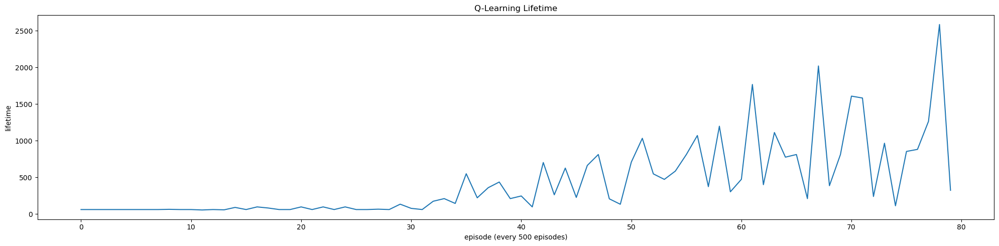

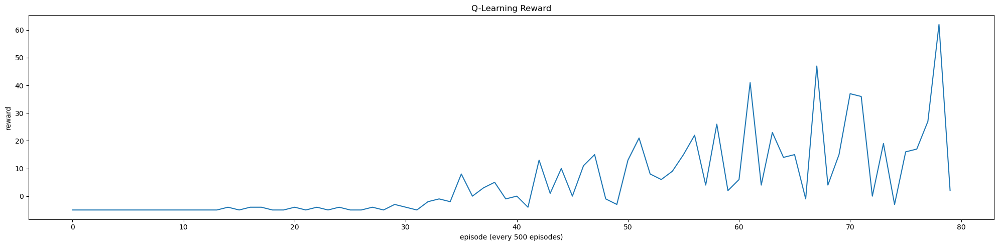

In [11]:
demo(agent_q_learning, './Q-Learning_Demo.mp4')
plot(lifetimes_q_learning, 'lifetime', 'Q-Learning Lifetime')
plot(rewards_q_learning, 'reward', 'Q-Learning Reward')


## SARSA

In [12]:
import math
import copy
from collections import defaultdict
import numpy as np


class AgentSarsa:
    def __init__(self,
                 bucket_range_per_feature,
                 num_action,
                 t=0,
                 discount_factor=0.99):
        self.update_parameters(t)  # init explore rate and learning rate
        self.q_table = defaultdict(lambda: np.zeros(num_action))
        self.discount_factor = discount_factor
        self.num_action = num_action

        # how to discretize each feature in a state
        # the higher each value, less time to train but with worser performance
        # e.g. if range = 2, feature with value 1 is equal to feature with value 0 bacause int(1/2) = int(0/2)
        self.bucket_range_per_feature = bucket_range_per_feature

    def select_action(self, state):
        # epsilon-greedy
        state_idx = self.get_state_idx(state)
        if np.random.rand() < self.exploring_rate:
            # Select a random action
            action = np.random.choice(self.num_action)
        else:
            # Select the action with the highest q
            action = np.argmax(self.q_table[state_idx])
        return action

    def update_policy(self, state, action, reward, state_prime, action_prime):
        state_idx = self.get_state_idx(state)
        state_prime_idx = self.get_state_idx(state_prime)
        # Update Q_value using SARSA update rule
        q = self.q_table[state_prime_idx][action_prime]
        self.q_table[state_idx][action] += self.learning_rate * (
            reward + self.discount_factor * q - self.q_table[state_idx][action])

    def get_state_idx(self, state):
        # instead of using absolute position of pipe, use relative position
        state = copy.deepcopy(state)
        state['next_next_pipe_bottom_y'] -= state['player_y']
        state['next_next_pipe_top_y'] -= state['player_y']
        state['next_pipe_bottom_y'] -= state['player_y']
        state['next_pipe_top_y'] -= state['player_y']

        # sort to make list converted from dict ordered in alphabet order
        state_key = [k for k, v in sorted(state.items())]

        # do bucketing to decrease state space to speed up training
        state_idx = []
        for key in state_key:
            state_idx.append(int(state[key] / self.bucket_range_per_feature[key]))
        return tuple(state_idx)

    def update_parameters(self, episode):
        self.exploring_rate = max(MIN_EXPLORING_RATE, min(0.5, 0.99 ** (episode / 30)))
        self.learning_rate = max(MIN_LEARNING_RATE, min(0.5, 0.99 ** (episode / 30)))

    def shutdown_explore(self):
        # make action selection greedy
        self.exploring_rate = 0


In [13]:
# init agent
agent_sarsa = AgentSarsa(bucket_range_per_feature, num_action)


In [14]:
from IPython.display import Image, display

lifetimes_sarsa = []
rewards_sarsa = []
exploring_rates_sarsa = []
learning_rates_sarsa = []

for episode in range(0, NUM_EPISODE):
    # Reset the environment
    env.reset_game()

    # record frame
    frames = [env.getScreenRGB()]

    # for every 500 episodes, shutdown exploration to see performance of greedy action
    if episode % PRINT_EVERY_EPISODE == 0:
        agent_sarsa.shutdown_explore()

    # the initial state
    state = game.getGameState()
    # cumulate reward for this episode
    cum_reward = 0
    t = 0

    # select an initial action
    action = agent_sarsa.select_action(state)

    while not env.game_over():
        # execute the action and get reward
        # reward = +1 when pass a pipe, -5 when die
        reward = env.act(env.getActionSet()[action])

        frames.append(env.getScreenRGB())

        # cumulate reward
        cum_reward += reward

        # observe the result
        state_prime = game.getGameState()  # get next state
        action_prime = agent_sarsa.select_action(state_prime)  # get next action

        # update agent
        agent_sarsa.update_policy(state, action, reward, state_prime, action_prime)

        # Setting up for the next iteration
        state = state_prime
        action = action_prime
        t += 1

    # update exploring_rate and learning_rate
    agent_sarsa.update_parameters(episode)

    if episode % PRINT_EVERY_EPISODE == 0:
        print("Episode {} finished after {} time steps, cumulated reward: {}, exploring rate: {}, learning rate: {}".format(
            episode,
            t,
            cum_reward,
            agent_sarsa.exploring_rate,
            agent_sarsa.learning_rate
        ))
        lifetimes_sarsa.append(t)
        rewards_sarsa.append(cum_reward)
        exploring_rates_sarsa.append(agent_sarsa.exploring_rate)
        learning_rates_sarsa.append(agent_sarsa.learning_rate)

    # for every 5000 episode, record an animation
    if episode % SHOW_GIF_EVERY_EPISODE == 0:
        print("len frames:", len(frames))
        clip = make_anim(frames, fps=60, true_image=True).rotate(-90)
        display(clip.ipython_display(fps=60, autoplay=1, loop=1))


Episode 0 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.5, learning rate: 0.5
len frames: 63
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


Episode 500 finished after 61 time steps, cumulated reward: -5.0, exploring rate: 0.5, learning rate: 0.5
Episode 1000 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.5, learning rate: 0.5
Episode 1500 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.5, learning rate: 0.5
Episode 2000 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.5, learning rate: 0.5
Episode 2500 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.43277903725889943, learning rate: 0.5
Episode 3000 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.3660323412732292, learning rate: 0.5
Episode 3500 finished after 61 time steps, cumulated reward: -5.0, exploring rate: 0.30957986252419073, learning rate: 0.5
Episode 4000 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.26183394327157605, learning rate: 0.5
Episode 4500 finished after 62 time steps, cumulated reward: -5.0, exploring rate:

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Episode 5500 finished after 77 time steps, cumulated reward: -4.0, exploring rate: 0.15841112426184903, learning rate: 0.5
Episode 6000 finished after 50 time steps, cumulated reward: -5.0, exploring rate: 0.13397967485796172, learning rate: 0.5
Episode 6500 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.11331624189077398, learning rate: 0.5
Episode 7000 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.09583969128049684, learning rate: 0.5
Episode 7500 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.08105851616218128, learning rate: 0.5
Episode 8000 finished after 66 time steps, cumulated reward: -4.0, exploring rate: 0.0685570138491429, learning rate: 0.5
Episode 8500 finished after 67 time steps, cumulated reward: -4.0, exploring rate: 0.05798359469728905, learning rate: 0.5
Episode 9000 finished after 75 time steps, cumulated reward: -4.0, exploring rate: 0.04904089407128572, learning rate: 0.5
Episode 9500 fini

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Episode 10500 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.029670038450977102, learning rate: 0.5
Episode 11000 finished after 74 time steps, cumulated reward: -4.0, exploring rate: 0.02509408428990297, learning rate: 0.5
Episode 11500 finished after 183 time steps, cumulated reward: -1.0, exploring rate: 0.021223870922486707, learning rate: 0.5
Episode 12000 finished after 98 time steps, cumulated reward: -4.0, exploring rate: 0.017950553275045137, learning rate: 0.5
Episode 12500 finished after 175 time steps, cumulated reward: -2.0, exploring rate: 0.015182073244652034, learning rate: 0.5
Episode 13000 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.012840570676248398, learning rate: 0.5
Episode 13500 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.010860193639877882, learning rate: 0.5
Episode 14000 finished after 147 time steps, cumulated reward: -2.0, exploring rate: 0.01, learning rate: 0.5
Episode 14500 

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Episode 15500 finished after 134 time steps, cumulated reward: -3.0, exploring rate: 0.01, learning rate: 0.5
Episode 16000 finished after 220 time steps, cumulated reward: 0.0, exploring rate: 0.01, learning rate: 0.5
Episode 16500 finished after 93 time steps, cumulated reward: -4.0, exploring rate: 0.01, learning rate: 0.5
Episode 17000 finished after 211 time steps, cumulated reward: -1.0, exploring rate: 0.01, learning rate: 0.5
Episode 17500 finished after 473 time steps, cumulated reward: 6.0, exploring rate: 0.01, learning rate: 0.5
Episode 18000 finished after 324 time steps, cumulated reward: 2.0, exploring rate: 0.01, learning rate: 0.5
Episode 18500 finished after 134 time steps, cumulated reward: -3.0, exploring rate: 0.01, learning rate: 0.5
Episode 19000 finished after 247 time steps, cumulated reward: 0.0, exploring rate: 0.01, learning rate: 0.5
Episode 19500 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.01, learning rate: 0.5
Episode 20000 fi

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Episode 20500 finished after 360 time steps, cumulated reward: 3.0, exploring rate: 0.01, learning rate: 0.5
Episode 21000 finished after 98 time steps, cumulated reward: -4.0, exploring rate: 0.01, learning rate: 0.5
Episode 21500 finished after 448 time steps, cumulated reward: 6.0, exploring rate: 0.01, learning rate: 0.5
Episode 22000 finished after 132 time steps, cumulated reward: -3.0, exploring rate: 0.01, learning rate: 0.5
Episode 22500 finished after 180 time steps, cumulated reward: -1.0, exploring rate: 0.01, learning rate: 0.5
Episode 23000 finished after 247 time steps, cumulated reward: 0.0, exploring rate: 0.01, learning rate: 0.5
Episode 23500 finished after 134 time steps, cumulated reward: -3.0, exploring rate: 0.01, learning rate: 0.5
Episode 24000 finished after 183 time steps, cumulated reward: -1.0, exploring rate: 0.01, learning rate: 0.5
Episode 24500 finished after 98 time steps, cumulated reward: -4.0, exploring rate: 0.01, learning rate: 0.5
Episode 25000 f

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Episode 25500 finished after 134 time steps, cumulated reward: -3.0, exploring rate: 0.01, learning rate: 0.5
Episode 26000 finished after 251 time steps, cumulated reward: 1.0, exploring rate: 0.01, learning rate: 0.5
Episode 26500 finished after 1051 time steps, cumulated reward: 22.0, exploring rate: 0.01, learning rate: 0.5
Episode 27000 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.01, learning rate: 0.5
Episode 27500 finished after 288 time steps, cumulated reward: 1.0, exploring rate: 0.01, learning rate: 0.5
Episode 28000 finished after 699 time steps, cumulated reward: 12.0, exploring rate: 0.01, learning rate: 0.5
Episode 28500 finished after 62 time steps, cumulated reward: -5.0, exploring rate: 0.01, learning rate: 0.5
Episode 29000 finished after 867 time steps, cumulated reward: 17.0, exploring rate: 0.01, learning rate: 0.5
Episode 29500 finished after 1002 time steps, cumulated reward: 20.0, exploring rate: 0.01, learning rate: 0.5
Episode 3000

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Episode 30500 finished after 211 time steps, cumulated reward: -1.0, exploring rate: 0.01, learning rate: 0.5
Episode 31000 finished after 699 time steps, cumulated reward: 12.0, exploring rate: 0.01, learning rate: 0.5
Episode 31500 finished after 889 time steps, cumulated reward: 17.0, exploring rate: 0.01, learning rate: 0.5
Episode 32000 finished after 278 time steps, cumulated reward: 1.0, exploring rate: 0.01, learning rate: 0.5
Episode 32500 finished after 182 time steps, cumulated reward: -1.0, exploring rate: 0.01, learning rate: 0.5
Episode 33000 finished after 288 time steps, cumulated reward: 1.0, exploring rate: 0.01, learning rate: 0.5
Episode 33500 finished after 1716 time steps, cumulated reward: 39.0, exploring rate: 0.01, learning rate: 0.5
Episode 34000 finished after 2322 time steps, cumulated reward: 55.0, exploring rate: 0.01, learning rate: 0.5
Episode 34500 finished after 452 time steps, cumulated reward: 6.0, exploring rate: 0.01, learning rate: 0.5
Episode 350

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Episode 35500 finished after 586 time steps, cumulated reward: 9.0, exploring rate: 0.01, learning rate: 0.5
Episode 36000 finished after 134 time steps, cumulated reward: -3.0, exploring rate: 0.01, learning rate: 0.5
Episode 36500 finished after 4957 time steps, cumulated reward: 125.0, exploring rate: 0.01, learning rate: 0.5
Episode 37000 finished after 1949 time steps, cumulated reward: 46.0, exploring rate: 0.01, learning rate: 0.5
Episode 37500 finished after 1009 time steps, cumulated reward: 21.0, exploring rate: 0.01, learning rate: 0.5
Episode 38000 finished after 162 time steps, cumulated reward: -2.0, exploring rate: 0.01, learning rate: 0.5
Episode 38500 finished after 776 time steps, cumulated reward: 14.0, exploring rate: 0.01, learning rate: 0.5
Episode 39000 finished after 1002 time steps, cumulated reward: 20.0, exploring rate: 0.01, learning rate: 0.5
Episode 39500 finished after 3036 time steps, cumulated reward: 74.0, exploring rate: 0.01, learning rate: 0.5


Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


Moviepy - Building video ./SARSA_Demo.mp4.
Moviepy - Writing video ./SARSA_Demo.mp4



Moviepy - Done !
Moviepy - video ready ./SARSA_Demo.mp4


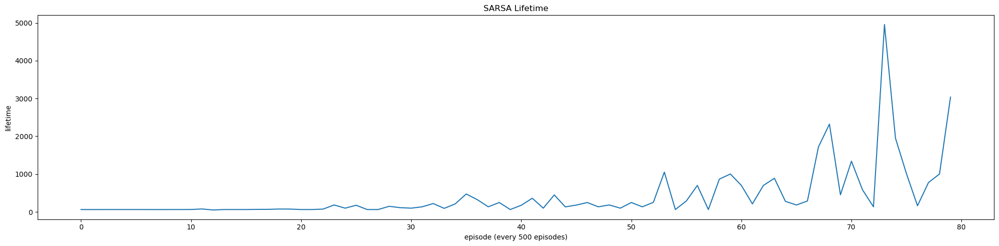

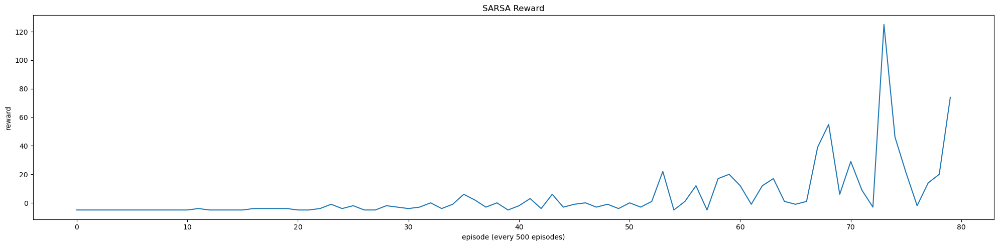

In [15]:
demo(agent_sarsa, './SARSA_Demo.mp4')
plot(lifetimes_sarsa, 'lifetime', 'SARSA Lifetime')
plot(rewards_sarsa, 'reward', 'SARSA Reward')


## Report

由於lifetime與reward在這邊的計算方式類似，lifetime是指在死掉之前做了幾個action，而reward則是指在死掉之前過了的水管數-5，即活得越久reward越高，兩者呈現正相關使得兩張線圖看起來差不多，因此我們就直接以reward比較兩個不同方法之間的差異。由Q-Learning與SARSA的reward線圖可以看出，雖然兩者的reward都有劇烈浮動，可是Q-Learning在訓練35x500個episode之後reward大部分就都是正的且有較多的高峰大多落在20與40附近，而SARSA則是在50x500個episode之後才開始變好，高峰雖也落在20附近不過高峰較少，這與講義上說Q-Learning走得比較是最佳路徑而SARSA則是會走保守路線不謀而合。不過以最高的reward來看Q-Learning的reward大約是在60左右，但SARSA的則是有到120，這點倒是讓我比較訝異。


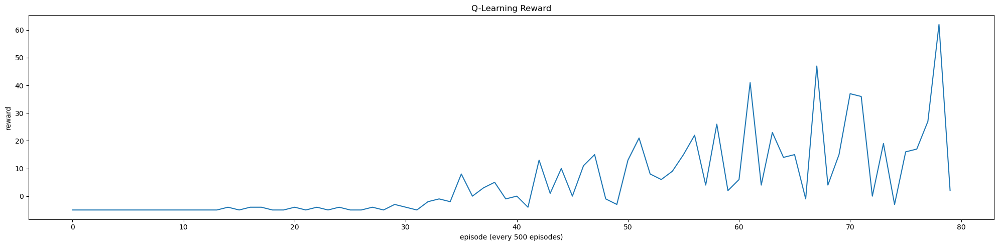

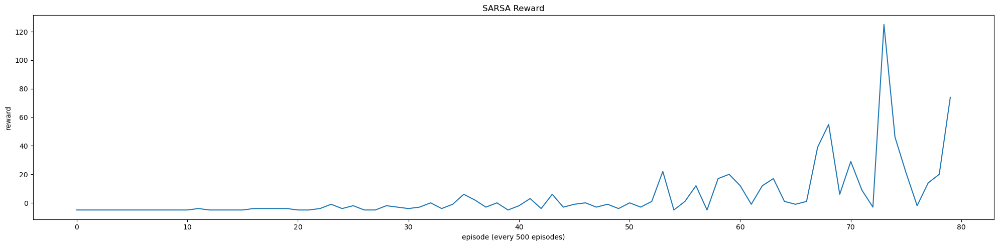

In [16]:
plot(rewards_q_learning, 'reward', 'Q-Learning Reward')
plot(rewards_sarsa, 'reward', 'SARSA Reward')
